In [1]:
import torch
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
timestamp = "2022_1025_1721_42"

## Random model

In [3]:
from peaknet.methods.unet import UNet
from peaknet.model        import ConfigPeakFinderModel, PeakFinderModel

In [4]:
base_channels = 8
pos_weight    = 20.0
method = UNet( in_channels = 1, out_channels = 1, base_channels = base_channels )
config_peakfinder = ConfigPeakFinderModel( method = method, 
                                           pos_weight = pos_weight, )
model = PeakFinderModel(config_peakfinder)
model.init_params()

In [5]:
#model.init_params(from_timestamp = timestamp)   # Run this will load a trained model

In [6]:
# Load model to gpus if available...
device = torch.cuda.current_device() if torch.cuda.is_available() else 'cpu'
model  = torch.nn.DataParallel(model.method).to(device)

## Define hooks

In [7]:
# Define hooks...
activation_dict = {}
preactivation_dict = {}
def get_activation(name, tag = ''):
    if tag not in preactivation_dict: preactivation_dict[tag] = {}
    if tag not in activation_dict: activation_dict[tag] = {}
    def hook(model, input, output):
        preactivation_dict[tag][name] = input
        activation_dict[tag][name] = output
    return hook


# Define what layer you want to check...
for name, layer in model.named_modules():
    if isinstance(layer, torch.nn.ReLU):
        layer.register_forward_hook(get_activation(name, 'relu'))

    if "final_conv" in name:
        layer.register_forward_hook(get_activation(name, 'final_conv'))

## Load an image

The model predicts many false peaks for a test image.  Why is that?

In [8]:
test_img = torch.load('test.img')
test_img = torch.tensor(test_img).to(device)
test_img = test_img[None, None]

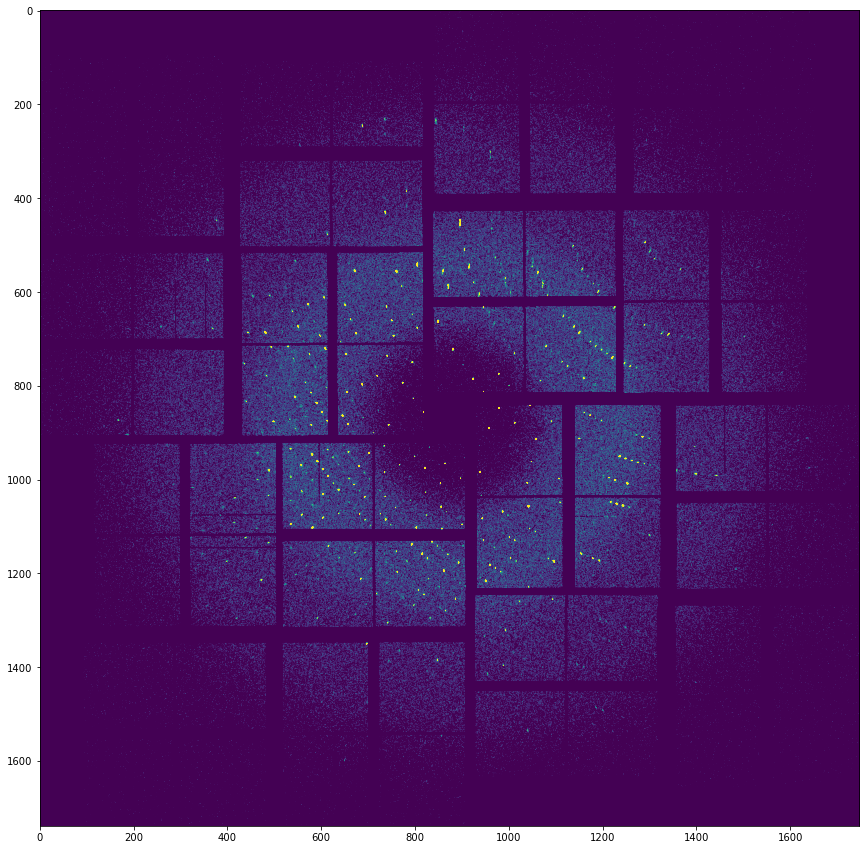

In [37]:
plt.figure(figsize=(20,15))
data = test_img[0, 0].cpu().detach().numpy()
vmin = data.mean()
vmax = vmin + 4 * data.std()
plt.imshow(data, vmin = vmin, vmax = vmax)

(array([2.000000e+00, 2.968359e+06, 7.006200e+04, 5.450000e+02,
        2.460000e+02, 1.310000e+02, 7.300000e+01, 6.100000e+01,
        4.200000e+01, 3.000000e+01, 1.900000e+01, 2.400000e+01,
        2.700000e+01, 1.600000e+01, 9.000000e+00, 1.400000e+01,
        1.100000e+01, 5.000000e+00, 5.000000e+00, 5.000000e+00,
        9.000000e+00, 9.000000e+00, 2.000000e+00, 9.000000e+00,
        3.000000e+00, 5.000000e+00, 3.000000e+00, 1.000000e+00,
        3.000000e+00, 1.000000e+00, 0.000000e+00, 3.000000e+00,
        5.000000e+00, 4.000000e+00, 2.000000e+00, 3.000000e+00,
        1.000000e+00, 1.000000e+00, 2.000000e+00, 0.000000e+00,
        1.000000e+00, 1.000000e+00, 1.000000e+00, 0.000000e+00,
        0.000000e+00, 0.000000e+00, 2.000000e+00, 2.000000e+00,
        4.000000e+00, 9.000000e+00]),
 array([ -440.0206 ,  -137.80737,   164.40585,   466.61908,   768.8323 ,
         1071.0455 ,  1373.2588 ,  1675.4719 ,  1977.6852 ,  2279.8984 ,
         2582.1116 ,  2884.325  ,  3186.538  ,  

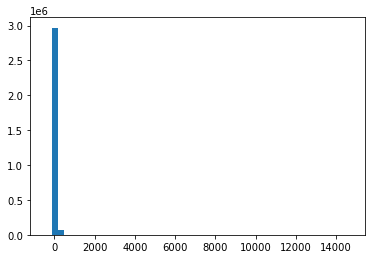

In [39]:
plt.hist(data.reshape(-1), bins = 50)
#plt.xlim(-2e2,3e2)

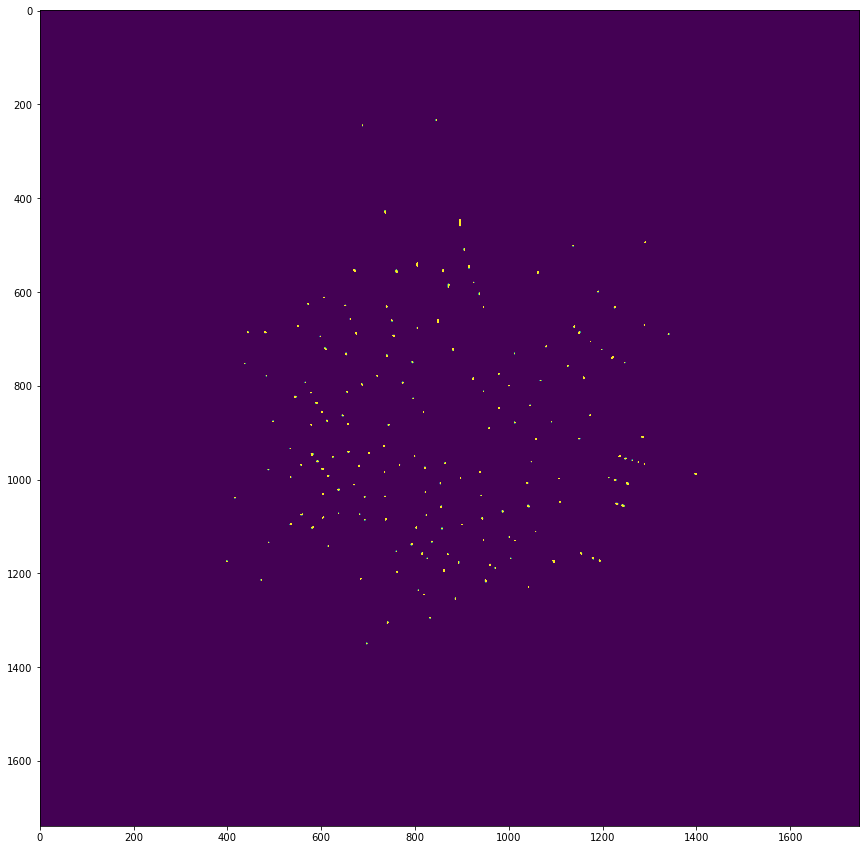

In [41]:
plt.figure(figsize=(20,15))
data = test_img[0, 0].cpu().detach().numpy()
data[data < 1000] = 0
data[data > 1000] = 1
vmin = data.mean()
vmax = vmin + 4 * data.std()
plt.imshow(data, vmin = vmin, vmax = vmax)

In [9]:
model.eval()
with torch.no_grad():
    fmap = model.forward(test_img)

In [10]:
fmap.shape

torch.Size([1, 1, 1728, 1744])

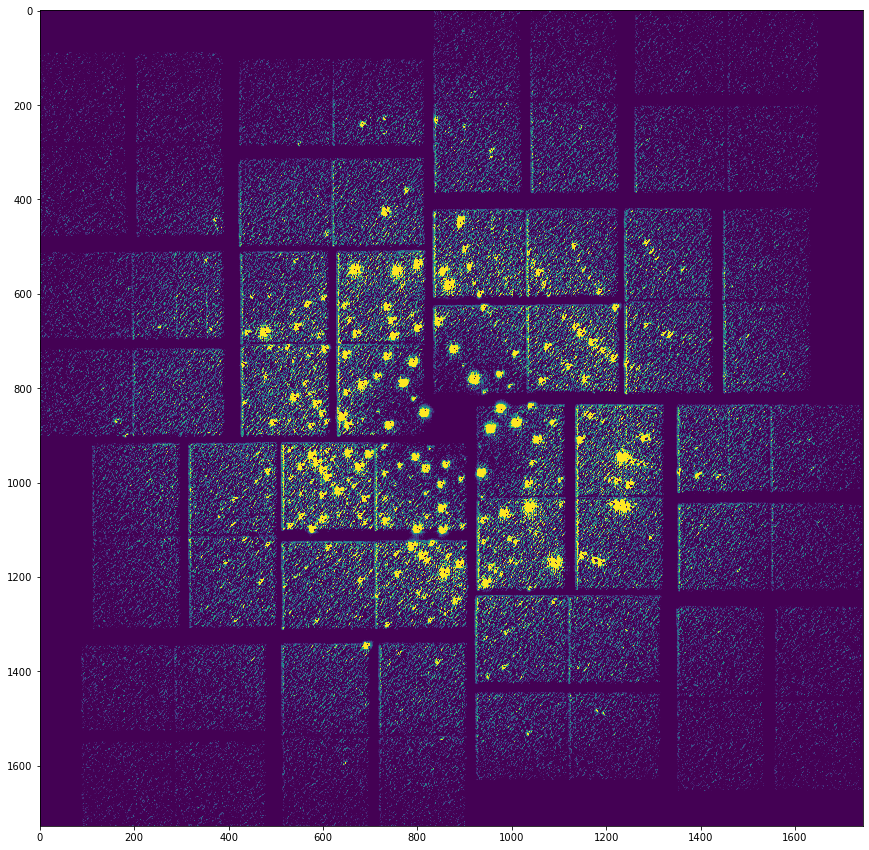

In [42]:
plt.figure(figsize=(20,15))
data = fmap[0, 0].cpu().detach().numpy()
vmin = data.mean()
vmax = vmin + data.std()
plt.imshow(data, vmin = vmin, vmax = vmax)

(-200.0, 300.0)

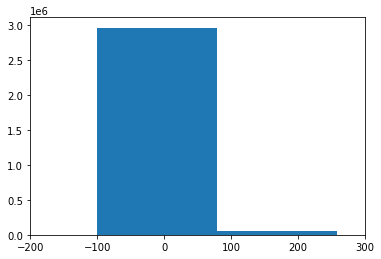

In [32]:
plt.hist(data.reshape(-1), bins = 50)
plt.xlim(-2e2,3e2)

## Activation

In [14]:
activation_dict['final_conv'].keys()

dict_keys(['module.final_conv'])

In [15]:
amap = activation_dict['final_conv']['module.final_conv']
amap.shape

torch.Size([1, 1, 1728, 1744])

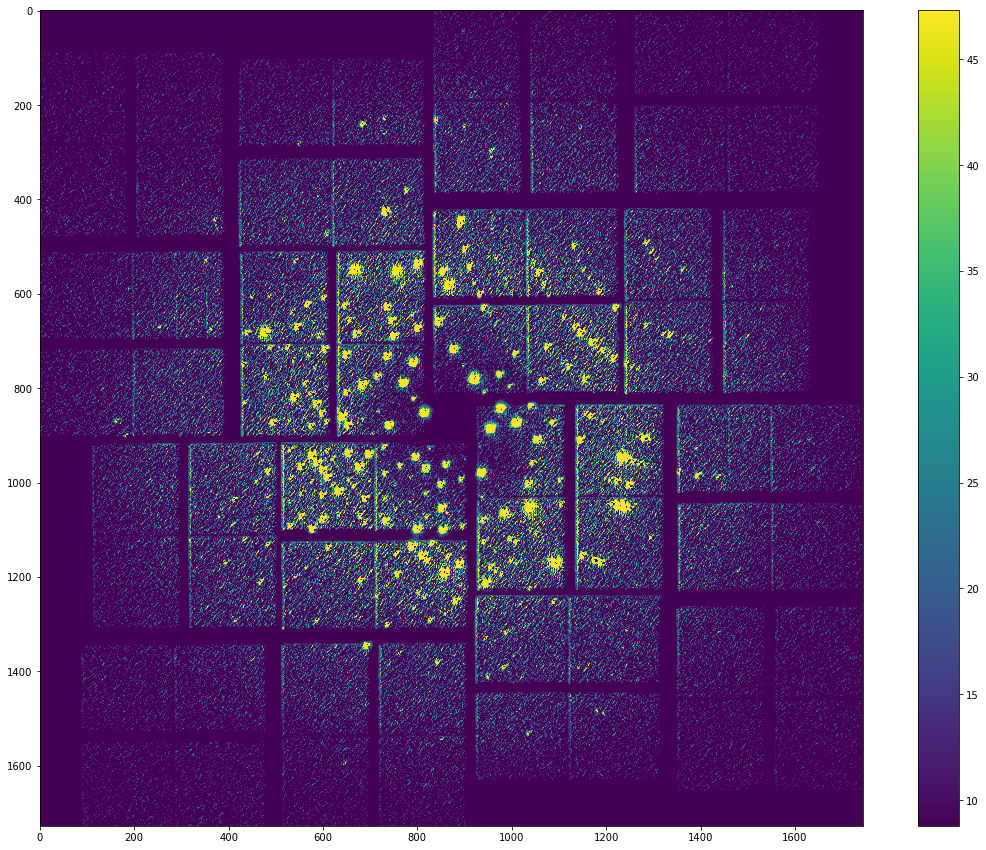

In [48]:
plt.figure(figsize=(20,15))
data = amap[0, 0].cpu().detach().numpy()
vmin = data.mean()
vmax = vmin + data.std()
plt.imshow(data, vmin = vmin, vmax = vmax)
plt.colorbar()

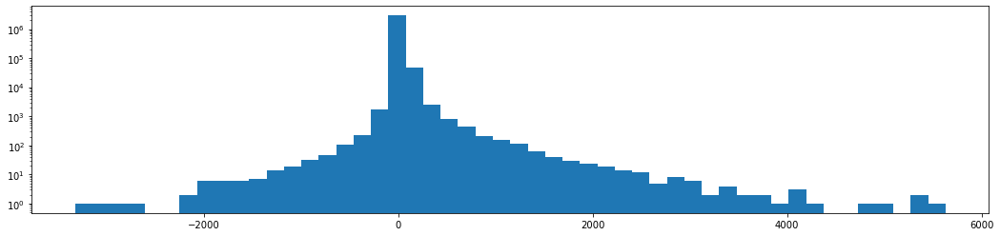

In [49]:
plt.figure(figsize=(18,4))
plt.hist(data.reshape(-1), bins = 50)
plt.yscale('log')
#plt.xlim(-2e2,3e2)

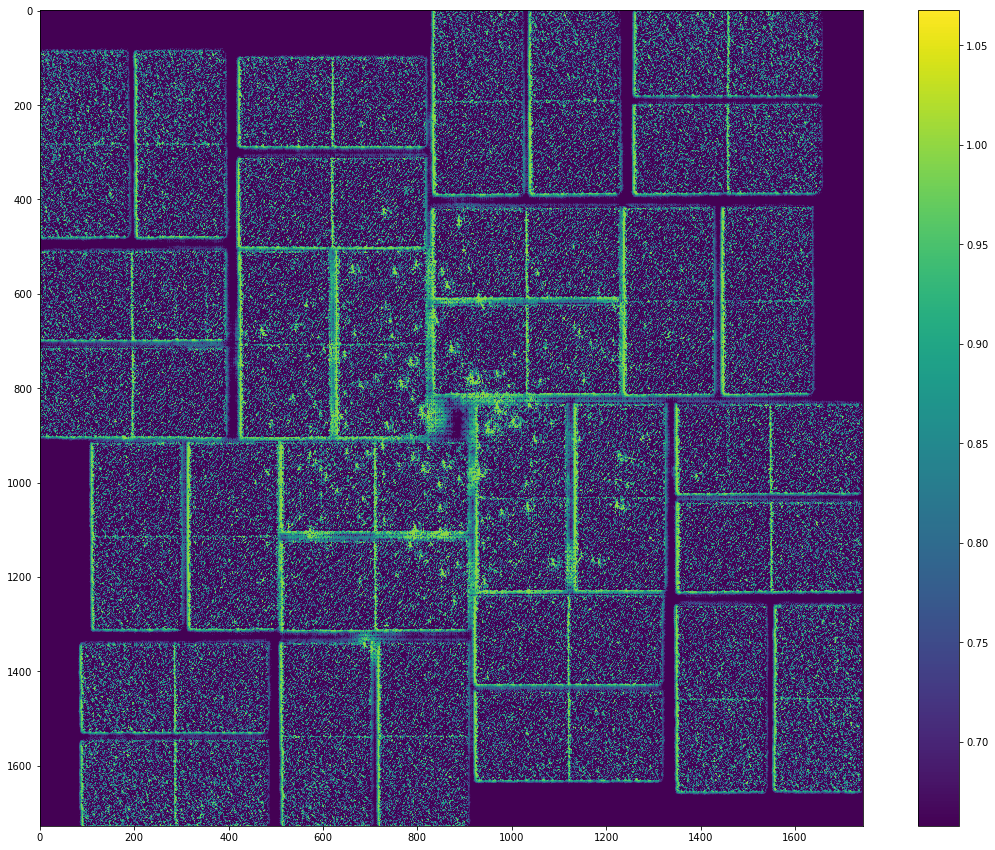

In [43]:
plt.figure(figsize=(20,15))
data = amap[0, 0].sigmoid().cpu().detach().numpy()
vmin = data.mean()
vmax = vmin + data.std()
plt.imshow(data, vmin = vmin, vmax = vmax)
plt.colorbar()

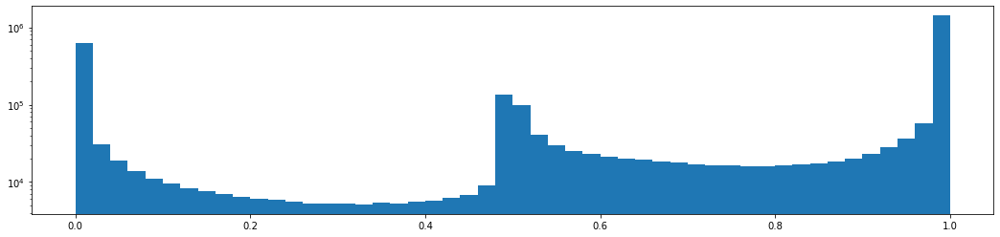

In [47]:
plt.figure(figsize=(18,4))
plt.hist(data.reshape(-1), bins = 50)
plt.yscale('log')
#plt.xlim(-2e2,3e2)

## Preactivation

In [19]:
preactivation_dict['final_conv'].keys()

dict_keys(['module.final_conv'])

In [20]:
preamap = preactivation_dict['final_conv']['module.final_conv']
preamap[0].shape

torch.Size([1, 8, 1728, 1744])

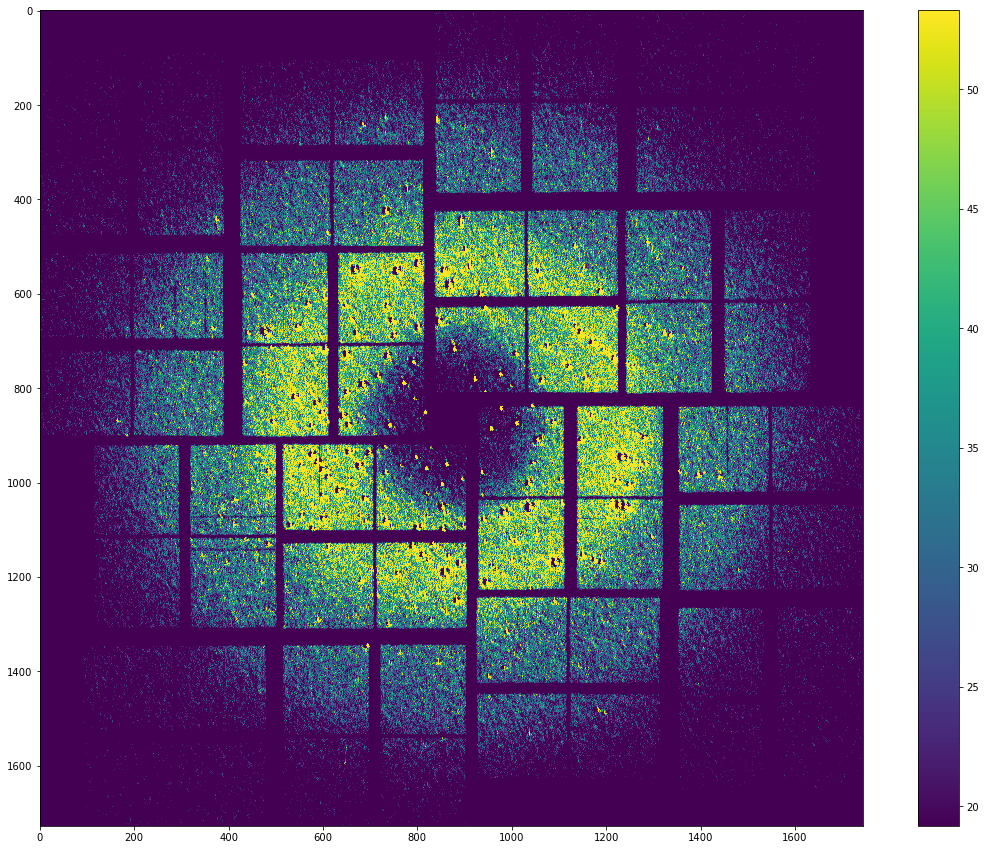

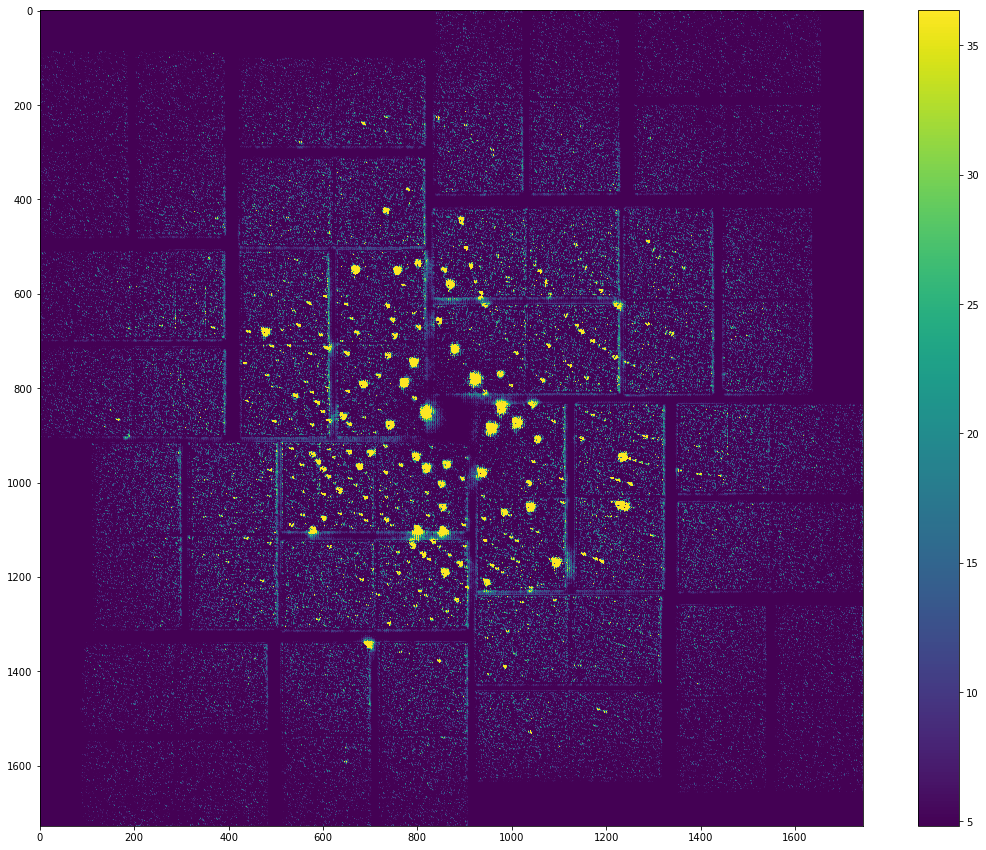

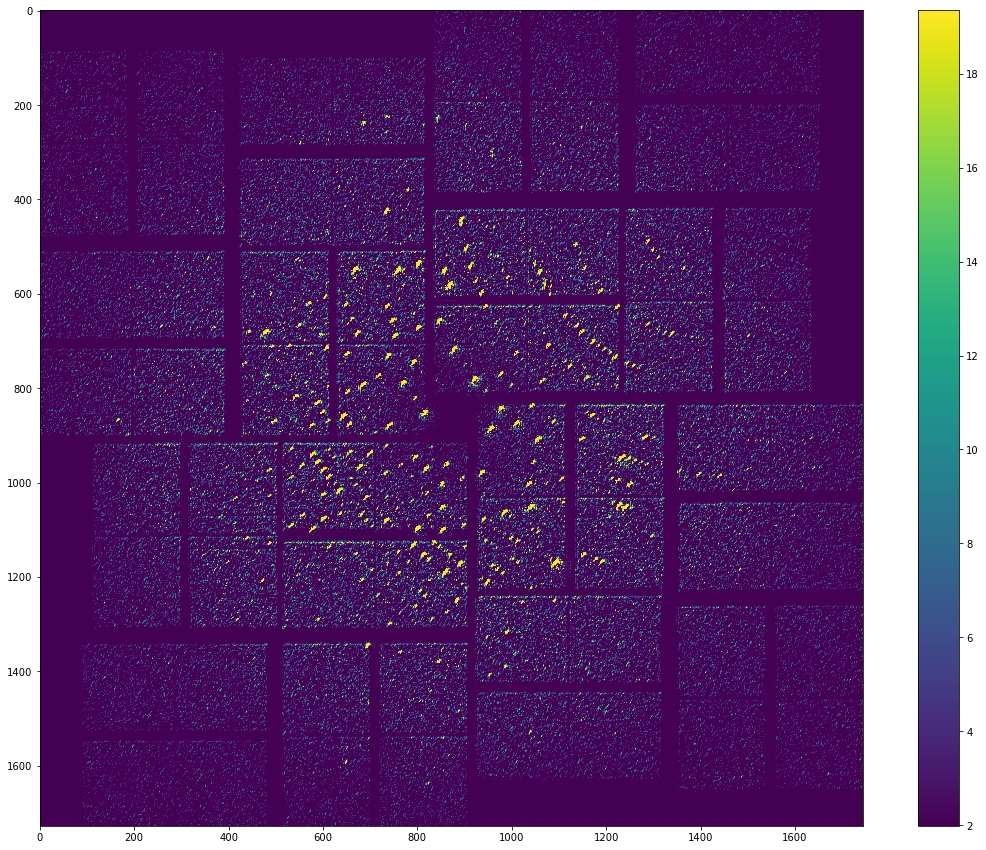

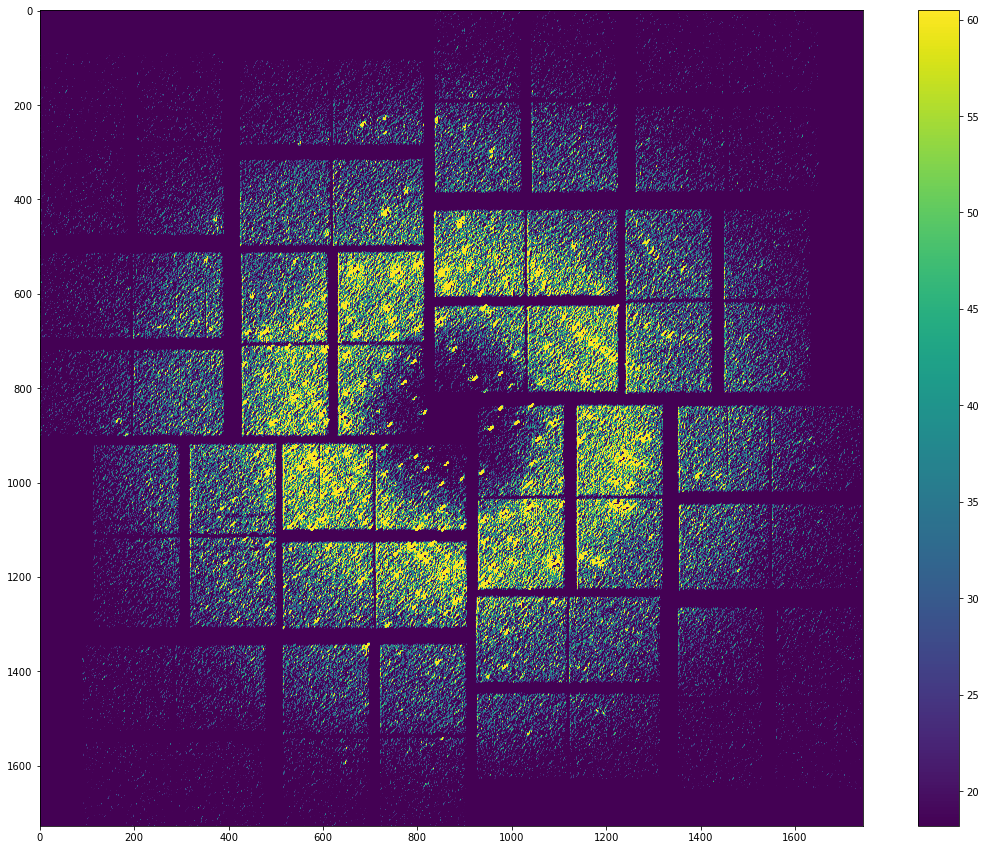

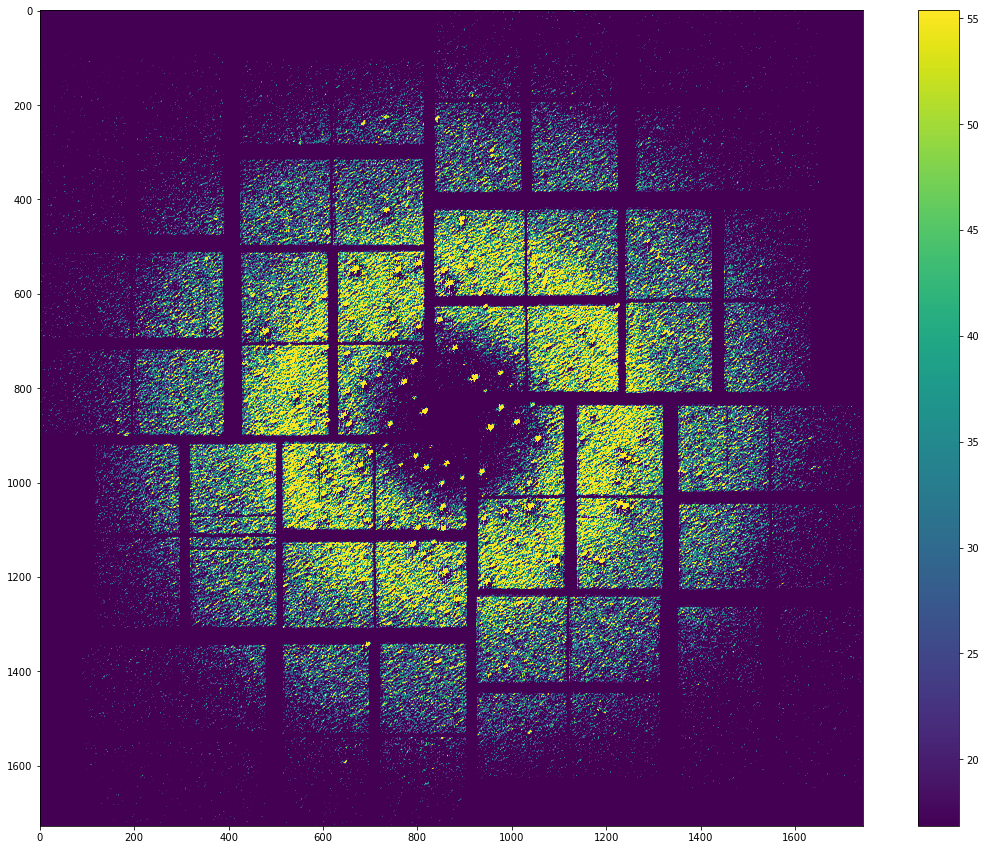

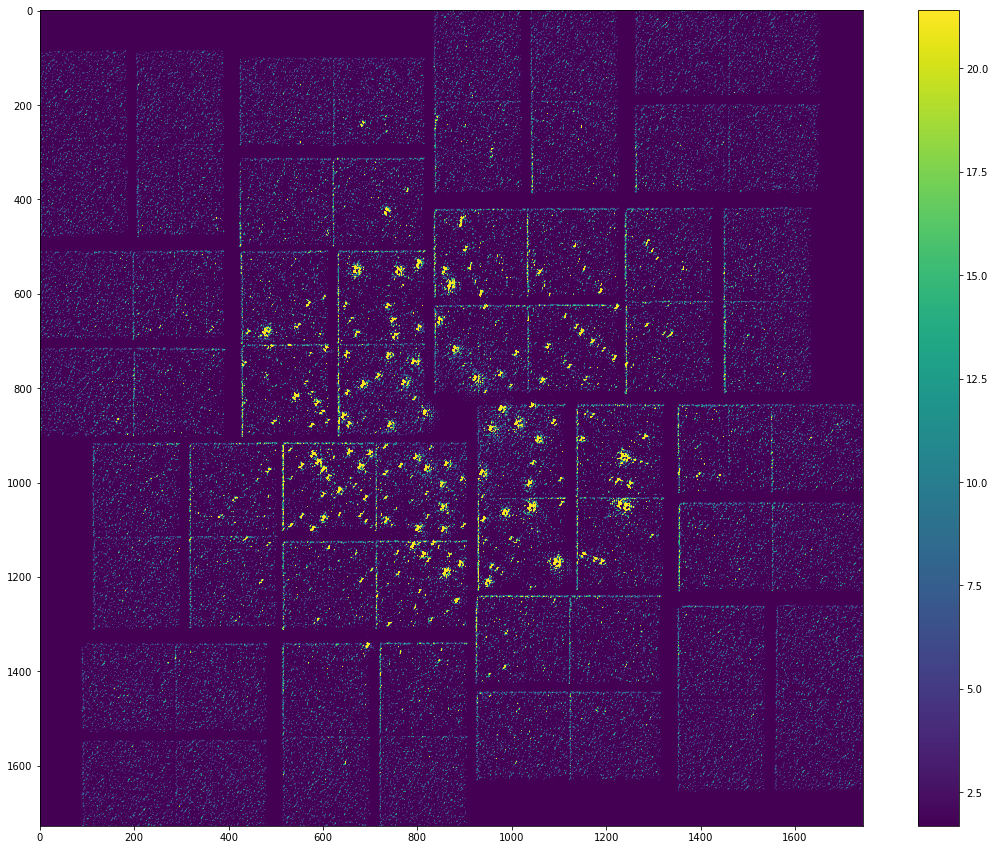

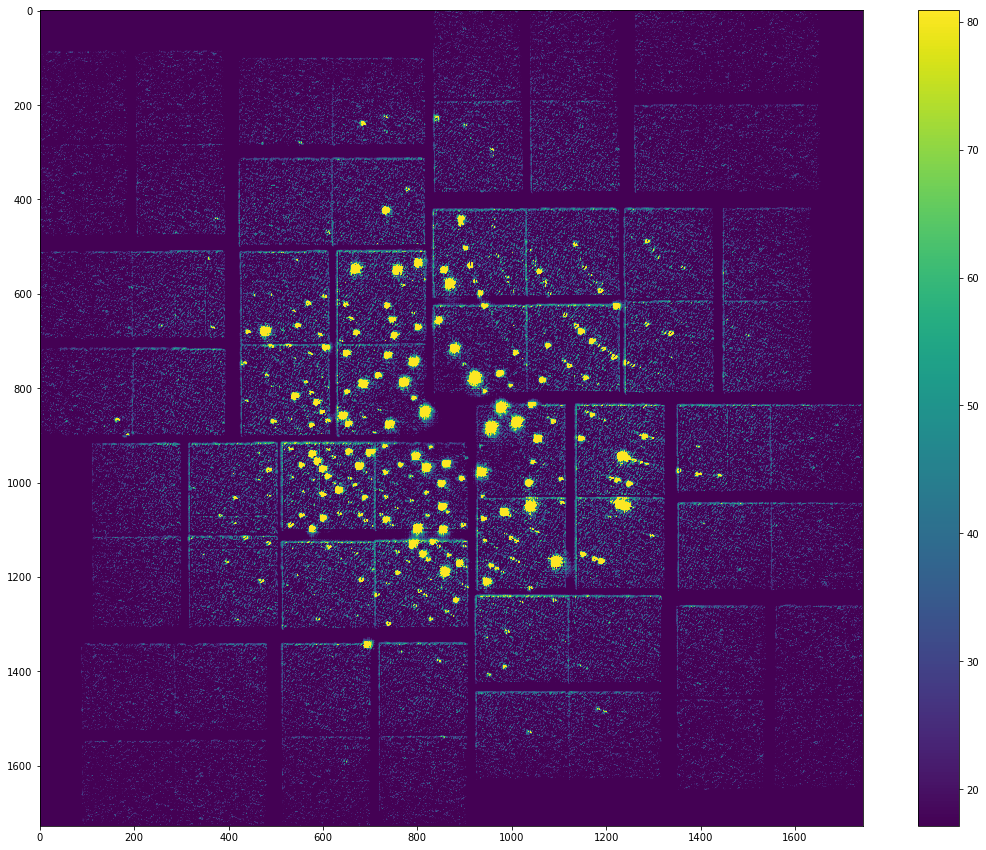

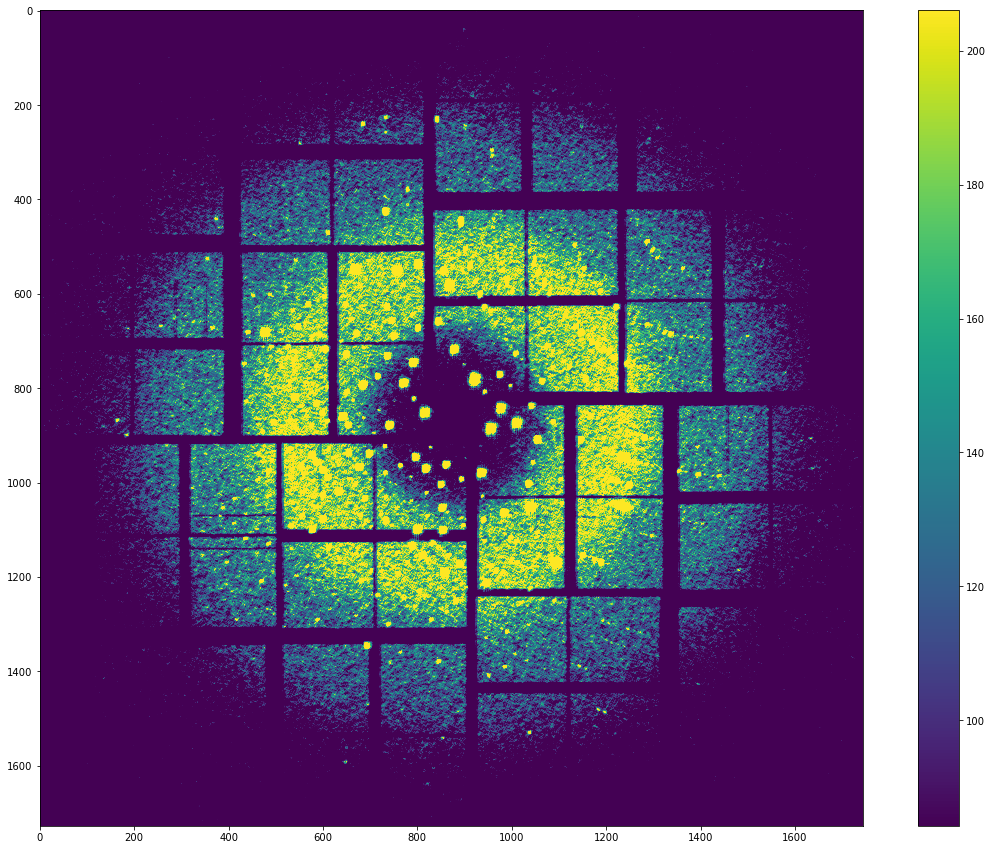

In [21]:
for i in range(len(preamap[0][0])):
    plt.figure(figsize=(20,15))
    data = preamap[0][0, i].cpu().detach().numpy()
    vmin = data.mean()
    vmax = vmin + data.std()
    plt.imshow(data, vmin = vmin, vmax = vmax)
    plt.colorbar()